<a href="https://colab.research.google.com/github/jakechinmk/data_science/blob/main/give_me_credit/01_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Objective
Conduct EDA to understand
- Missing values
- Cardinality
- Distribution
- Relationship between Target Variable and Features

# Setup

In [ ]:
!pip install -q dataprep feature_engine

## Import Libraries

In [ ]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import missingno as msno

from dataprep.eda import create_report, plot_diff
from dataprep.clean import clean_headers
from feature_engine.outliers import Winsorizer

## Global Configuration

In [ ]:
TRAIN_PATH = '/content/drive/MyDrive/Colab Notebooks/Paidy/data/cs-training.csv'
VALID_PATH = '/content/drive/MyDrive/Colab Notebooks/Paidy/data/cs-test.csv'
OUTPUT_DIR = '/content/drive/MyDrive/Colab Notebooks/Paidy/output/'
OUTPUT = True

# Data
## Information from Data Dictionary
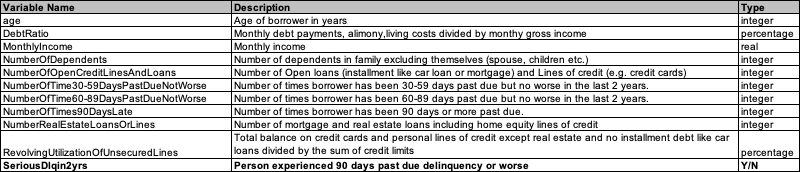

## Summary
- Target Variable: serious_dlqin_2yrs (person experienced 90 days past due delinquency of worse)
- Features
  - Gauge financial literacy
      - age
  - Gauge ability to repay debt
    - Lending Capability
      - number_of_open_credit_lines_and_loans (installment and credit cards)
      - number_real_estate_loans_or_lines (mortgage and real estate loans - secured loans kind of)
      - revolving_utilization_of_unsecured_lines (total balance on credit cards and personal lines of credit divided by sum of credit lines)
    - Family Commitment
      - number_of_dependents
      - monthly_income
      - debt_ratio
  - Historical performance of repaying debts
    - number_of_time_30_59_days_past_due_not_worse
    - number_of_time_60_89_days_past_due_not_worse
    - number_of_times_90_days_late
      


## Read Data

In [ ]:
index_col = 'Unnamed: 0'
train_df = clean_headers(pd.read_csv(TRAIN_PATH, index_col=index_col))
valid_df = clean_headers(pd.read_csv(VALID_PATH, index_col=index_col))

Column Headers Cleaning Report:
	10 values cleaned (90.91%)
Column Headers Cleaning Report:
	10 values cleaned (90.91%)


## Feature and Target Definition

In [ ]:
target = 'serious_dlqin_2yrs'
features = train_df.columns.drop(target).tolist()

## Exploration

### Train Dataset

In [ ]:
train_df.shape

(150000, 11)

In [ ]:
train_df.head()

,serious_dlqin_2yrs,revolving_utilization_of_unsecured_lines,age,number_of_time_30_59_days_past_due_not_worse,debt_ratio,monthly_income,number_of_open_credit_lines_and_loans,number_of_times_90_days_late,number_real_estate_loans_or_lines,number_of_time_60_89_days_past_due_not_worse,number_of_dependents
1,1,0.766127,45,2,0.802982,9120.0,13,0,6,0,2.0
2,0,0.957151,40,0,0.121876,2600.0,4,0,0,0,1.0
3,0,0.658180,38,1,0.085113,3042.0,2,1,0,0,0.0
4,0,0.233810,30,0,0.036050,3300.0,5,0,0,0,0.0
5,0,0.907239,49,1,0.024926,63588.0,7,0,1,0,0.0


In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 150000 entries, 1 to 150000
Data columns (total 11 columns):
 #   Column                                        Non-Null Count   Dtype  
---  ------                                        --------------   -----  
 0   serious_dlqin_2yrs                            150000 non-null  int64  
 1   revolving_utilization_of_unsecured_lines      150000 non-null  float64
 2   age                                           150000 non-null  int64  
 3   number_of_time_30_59_days_past_due_not_worse  150000 non-null  int64  
 4   debt_ratio                                    150000 non-null  float64
 5   monthly_income                                120269 non-null  float64
 6   number_of_open_credit_lines_and_loans         150000 non-null  int64  
 7   number_of_times_90_days_late                  150000 non-null  int64  
 8   number_real_estate_loans_or_lines             150000 non-null  int64  
 9   number_of_time_60_89_days_past_due_not_worse  15

### Valid Dataset

In [ ]:
valid_df.shape

(101503, 11)

In [ ]:
valid_df.head()

,serious_dlqin_2yrs,revolving_utilization_of_unsecured_lines,age,number_of_time_30_59_days_past_due_not_worse,debt_ratio,monthly_income,number_of_open_credit_lines_and_loans,number_of_times_90_days_late,number_real_estate_loans_or_lines,number_of_time_60_89_days_past_due_not_worse,number_of_dependents
1,NaN,0.885519,43,0,0.177513,5700.0,4,0,0,0,0.0
2,NaN,0.463295,57,0,0.527237,9141.0,15,0,4,0,2.0
3,NaN,0.043275,59,0,0.687648,5083.0,12,0,1,0,2.0
4,NaN,0.280308,38,1,0.925961,3200.0,7,0,2,0,0.0
5,NaN,1.000000,27,0,0.019917,3865.0,4,0,0,0,1.0


In [ ]:
valid_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 101503 entries, 1 to 101503
Data columns (total 11 columns):
 #   Column                                        Non-Null Count   Dtype  
---  ------                                        --------------   -----  
 0   serious_dlqin_2yrs                            0 non-null       float64
 1   revolving_utilization_of_unsecured_lines      101503 non-null  float64
 2   age                                           101503 non-null  int64  
 3   number_of_time_30_59_days_past_due_not_worse  101503 non-null  int64  
 4   debt_ratio                                    101503 non-null  float64
 5   monthly_income                                81400 non-null   float64
 6   number_of_open_credit_lines_and_loans         101503 non-null  int64  
 7   number_of_times_90_days_late                  101503 non-null  int64  
 8   number_real_estate_loans_or_lines             101503 non-null  int64  
 9   number_of_time_60_89_days_past_due_not_worse  10

### Distribution of Target

In [ ]:
print(f'Bad Payer is about {train_df.loc[:, target].mean():.2%} in training set')
print(f'Bad Payer is about {valid_df.loc[:, target].mean():.2%} in validation set')

Bad Payer is about 6.68% in training set
Bad Payer is about nan% in validation set


In [ ]:
valid_df.drop(columns=target, inplace=True)

# EDA

## Train Data

In [ ]:
report = create_report(df=train_df, title='Give Me Some Credit Train Dataset')
if OUTPUT:
  report.save(path=f'{OUTPUT_DIR}01-EDA-train.html')

Computing ks_2samp-3286b161e6ab810a4ff0785cf01a311a:  10%|█         | 217/2072 [00:03<00:18, 100.91it/s]   /usr/local/lib/python3.9/dist-packages/dataprep/eda/utils.py:392: RuntimeWarning: ks_2samp: Exact calculation unsuccessful. Switching to method=asymp.
  return cast(Tuple[float, float], ks_2samp_(data1, data2))
ERROR:bokeh.core.validation.check:E-1019 (DUPLICATE_FACTORS): FactorRange must specify a unique list of categorical factors for an axis: duplicate factors found: 'number_of_tim...rse'


Report has been saved to /content/drive/MyDrive/Colab Notebooks/Paidy/output/01-EDA-train.html!


Give Me Some Credit Train Dataset
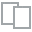
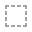
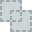
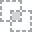
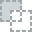
...
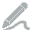
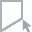
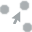
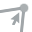
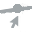

In [ ]:
report

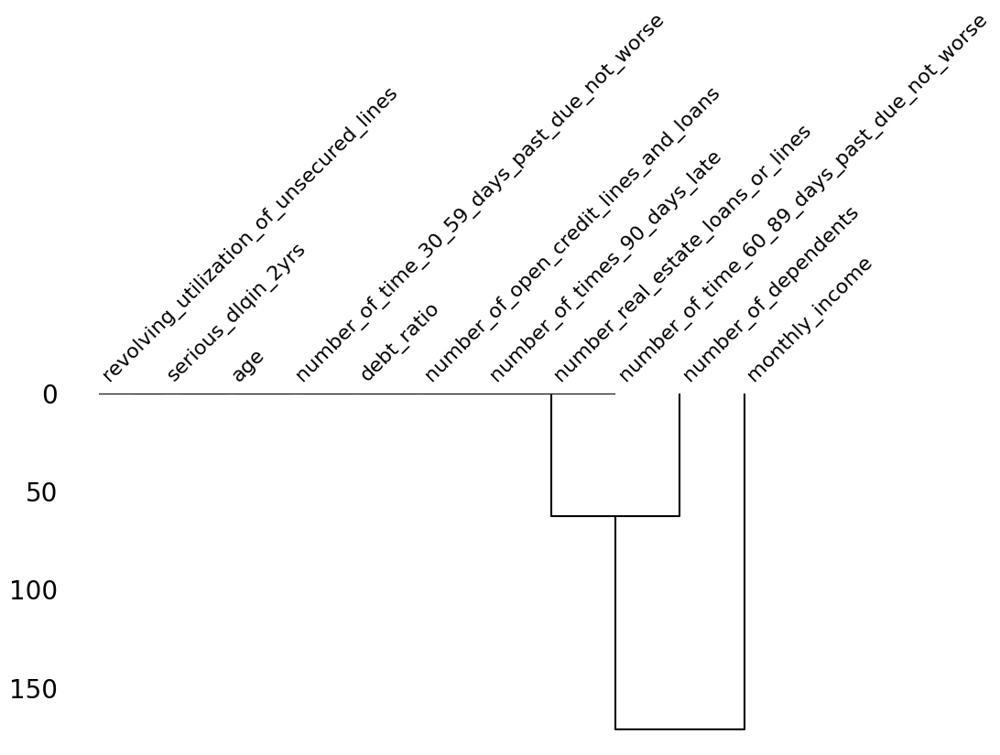

In [ ]:
msno.dendrogram(train_df, figsize=(10, 5))
plt.show()

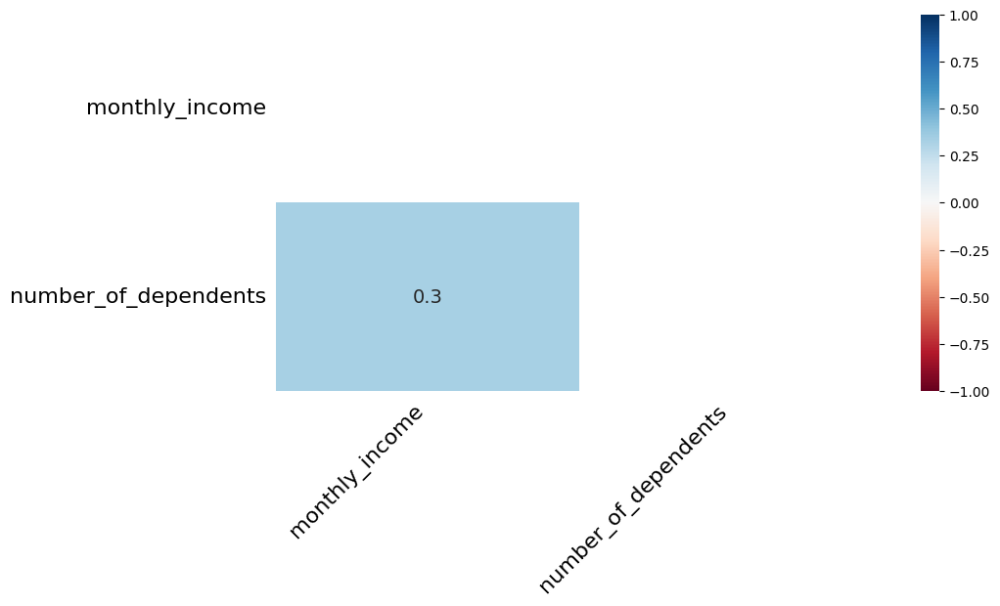

In [ ]:
msno.heatmap(train_df, figsize=(10, 5))
plt.show()

## Check Difference in Distribution

In [ ]:
mask = train_df.loc[:, target] == 0
report = plot_diff([train_df.loc[mask, :], train_df.loc[~mask, :]],
                   config={
                       'diff.label':['Good Payer', 'Bad Payer'],
                       'diff.density':True,
                       }
                   )
if OUTPUT:
  report.save(filename=f'{OUTPUT_DIR}01-EDA-train-diff.html')


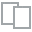
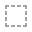
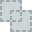
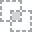
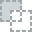
...
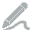
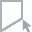
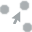
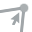
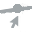

In [ ]:
report

## Conclusion on Train Data
Target Variable: serious_dlqin_2yrs (imbalanced 94% vs 6%)

- Missing Values (need to find a way to impute, not using mean since all data are skewed)
    - monthly_income
    - number_of_dependents
- Similar Distribution (high correlation)
    -  number_of_time_60_89_days_past_due_not_worse and number_of_times_90_days_late
- Skewed (Basically all features skewed except age)
    - Gauging the ability to repay debt
        - number_real_estate_loans_or_lines
        - number_of_dependents
        - monthly_income
        - debt_ratio
        - revolving_utilization_of_unsecured_lines
        - number_of_open_credit_lines_and_loans
    - Historical performance of repaying debts
        - number_of_time_30_59_days_past_due_not_worse
        - number_of_time_60_89_days_past_due_not_worse
        - number_of_times_90_days_late
- Zeros
    - Gauging the ability to repay debt
        - number_of_dependents (58%)
        - number_real_estate_loans_or_lines (37%)
        - revolving_utilization_of_unsecured_lines (7%)
    - Historical performance of repaying debts
        - number_of_time_30_59_days_past_due_not_worse (84%)
        - number_of_time_60_89_days_past_due_not_worse (94%)
        - number_of_times_90_days_late (95%)

- Weird Insights
    - why min age of 0, maximum age of 109 and 95th percentile on age 78 (doesn't match credit policy for a working adult)
    - why debt_ratio is more than 1 (ratio suppose to be from 0-1)
    - why monthly_income has a very huge gap either and it's having 0
    - why the number_of_dependent is having 95th percentile 3 but maximum of 20
    - why the number_of_open_credit_lines_and_loans having 95th percentile 18 but maximum of 58
    - why the number_of_time_30_59_days_past_due_not_worse 95th percentile 2 but maximum of 98 (this should have move into other buckets)
    - why the number_of_time_60_89_days_past_due_not_worse 95th percentile 1 but maximum of 98 (this should have move into other buckets)
    - why the number_of_times_90_days_late 95th percentile 1 but maximum of 98 (this should have move into delinquency)
    - why the number_real_estate_loans_or_lines 95th percentile 3 but maximum of 58 (since this repeat quite a lot of times, suspect there's a record issue
    - why revolving_utilization_of_unsecured_lines is more than 1 (ratio suppose to be from 0-1)

- Potential Good Predictor
  - Age: The younger age seems to be defaulted more as expected.
  - The remaining might need further studies because the visualization couldnt show a difference

## Valid Data

In [ ]:
report = create_report(df=valid_df, title='Give Me Some Credit Valid Dataset')
if OUTPUT:
  report.save(path=f'{OUTPUT_DIR}01-EDA-valid.html')

Computing ks_2samp-8e410fa93a83069c60e186ef5663ea78:   9%|▊         | 173/1993 [00:01<00:13, 131.57it/s]/usr/local/lib/python3.9/dist-packages/dataprep/eda/utils.py:392: RuntimeWarning: ks_2samp: Exact calculation unsuccessful. Switching to method=asymp.
  return cast(Tuple[float, float], ks_2samp_(data1, data2))
ERROR:bokeh.core.validation.check:E-1019 (DUPLICATE_FACTORS): FactorRange must specify a unique list of categorical factors for an axis: duplicate factors found: 'number_of_tim...rse'


Report has been saved to /content/drive/MyDrive/Colab Notebooks/Paidy/output/01-EDA-valid.html!


Give Me Some Credit Valid Dataset
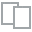
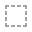
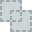
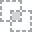
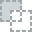
...
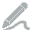
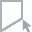
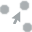
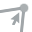
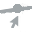

In [ ]:
report

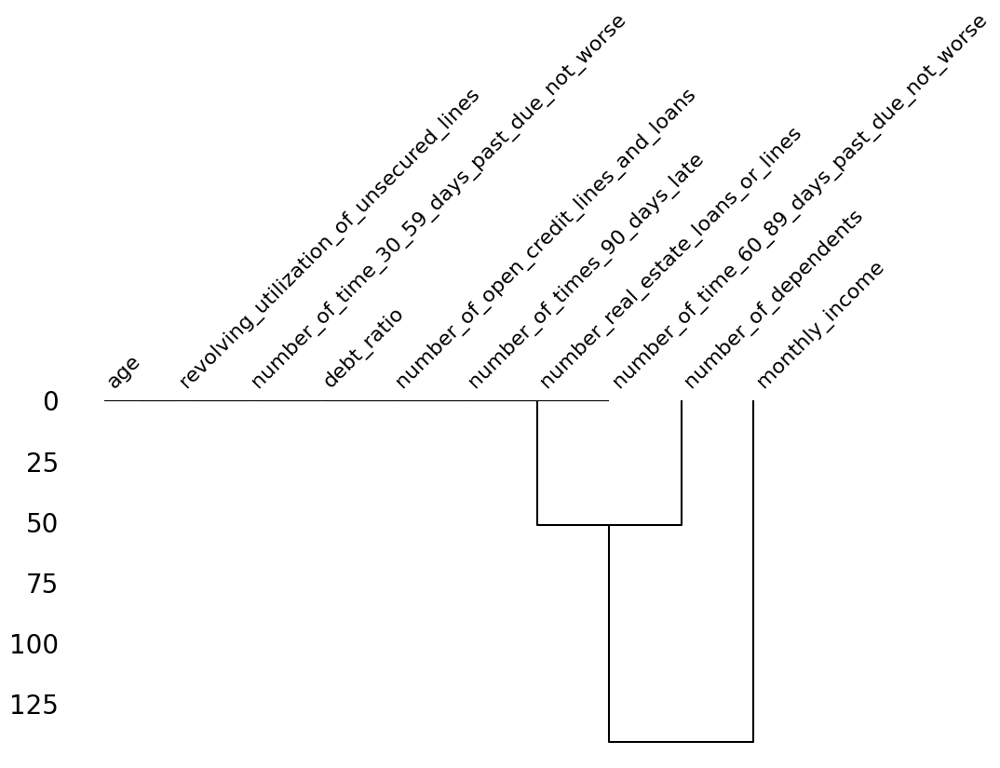

In [ ]:
msno.dendrogram(valid_df, figsize=(10, 5))
plt.show()

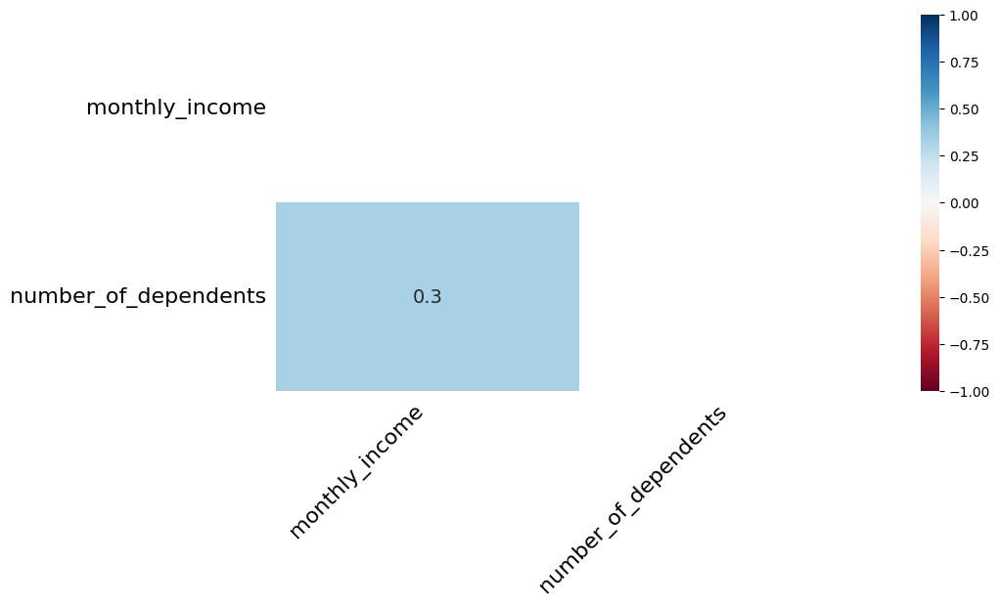

In [ ]:
msno.heatmap(valid_df, figsize=(10, 5))
plt.show()

## Conclusion on Validation Data
Target Variable: NA
Summary: It seems like both of the dataset have very same distribution statistics and insights. Need to find a way to cap all these ratio, but first finding out if all the weird insights are from the same records.

- ALMOST NO CHANGES
    - Missing Values (need to find a way to impute, not using mean since all data are skewed)
        - monthly_income
        - number_of_dependents
    - Similar Distribution (probably correlated)
        -  number_of_time_60_89_days_past_due_not_worse and number_of_times_90_days_late
    - Skewed (Basically all features skewed except age)
        - Gauging the ability to repay debt
            - number_real_estate_loans_or_lines
            - number_of_dependents
            - monthly_income
            - debt_ratio
            - revolving_utilization_of_unsecured_lines
            - number_of_open_credit_lines_and_loans
        - Historical performance of repaying debts
            - number_of_time_30_59_days_past_due_not_worse
            - number_of_time_60_89_days_past_due_not_worse
            - number_of_times_90_days_late
    - Zeros
        - Gauging the ability to repay debt
            - number_of_dependents (58%)
            - number_real_estate_loans_or_lines (38%)
            - revolving_utilization_of_unsecured_lines (7%)
        - Historical performance of repaying debts
            - number_of_time_30_59_days_past_due_not_worse (84%)
            - number_of_time_60_89_days_past_due_not_worse (94%)
            - number_of_times_90_days_late (95%)

    - Weird Insights
        - minimum age seems to be 21 instead of 0 over here. why maximum age of 104 and 95th percentile on age 78 (doesn't match credit policy for a working adult)
        - why debt_ratio is more than 1 (ratio suppose to be from 0-1)
        - why monthly_income has a very huge gap either and it's having 0
        - why the number_of_dependent is having 95th percentile 3 but maximum of 43
        - why the number_of_open_credit_lines_and_loans having 95th percentile 18 but maximum of 85
        - why the number_of_time_30_59_days_past_due_not_worse 95th percentile 2 but maximum of 98 (this should have move into other buckets)
        - why the number_of_time_60_89_days_past_due_not_worse 95th percentile 1 but maximum of 98 (this should have move into other buckets)
        - why the number_of_times_90_days_late 95th percentile 1 but maximum of 98 (this should have move into delinquency)
        - why the number_real_estate_loans_or_lines 95th percentile 3 but maximum of 37
        - why revolving_utilization_of_unsecured_lines is more than 1 (ratio suppose to be from 0-1)

# Check Weird Insights

To explain what is happening here, based on the weird insights
1. We first identify the columns that possibly require right-outlier detection, or both-end-outlier detection.
2. Then examine the outliers with MAD-median rule since we have a lot of outliers. Using the typical IQR method might bring cause slightly bias to the outliers.
3. To utilize the library (missingno) where some good plotting function can be used, we convert those that are indicated as 1 to missing value.
4. Plot the correlation heatmap of the (whether they are missing or not, and the connection between the outliers)
5. This is to visualize the connection between the outlier and identify them as not outliers as random.

In [ ]:
from sklearn.pipeline import Pipeline

In [ ]:
abnormal_list = [
    'debt_ratio',
    'revolving_utilization_of_unsecured_lines',
    'number_of_open_credit_lines_and_loans',
    'number_real_estate_loans_or_lines',
    # 'age', # both left and right range is weird
    # 'monthly_income', # both left and right range is weird
    # 'number_of_dependents',
    # 'number_of_time_30_59_days_past_due_not_worse',
    # 'number_of_time_60_89_days_past_due_not_worse',
    # 'number_of_times_90_days_late',
]

left_right_list = [
    'age',
    'monthly_income'
]

low_variation_list = [
    'number_of_dependents',
    'number_of_time_30_59_days_past_due_not_worse',
    'number_of_time_60_89_days_past_due_not_worse',
    'number_of_times_90_days_late'
]

abnormal_wz = Winsorizer(capping_method='mad',
                        variables=abnormal_list,
                        add_indicators=True,
                        missing_values='ignore')

lr_wz = Winsorizer(capping_method='mad',
                   variables=left_right_list,
                   add_indicators=True,
                   tail='both',
                   missing_values='ignore')

lv_wz = Winsorizer(capping_method='gaussian',
                   variables=low_variation_list,
                   add_indicators=True,
                   missing_values='ignore')

pipeline = Pipeline(
    steps=[('mad_outlier', abnormal_wz),
           ('left_right_outlier', lr_wz),
           ('low_variation_outlier', lv_wz),
           ]
)

abnormal_df = pipeline.fit_transform(train_df)

columns = abnormal_df.columns 
mask = columns.str.contains('_left|_right')
col_list = columns[mask].tolist()

abnormal_df = abnormal_df.loc[:, col_list]

In [ ]:
abnormal_df.sum(axis=1).value_counts()

0.0    90870
1.0    51931
2.0     6660
3.0      261
4.0      248
5.0       30
dtype: int64

In [ ]:
abnormal_df = abnormal_df.replace({1:np.NaN})

<Axes: >

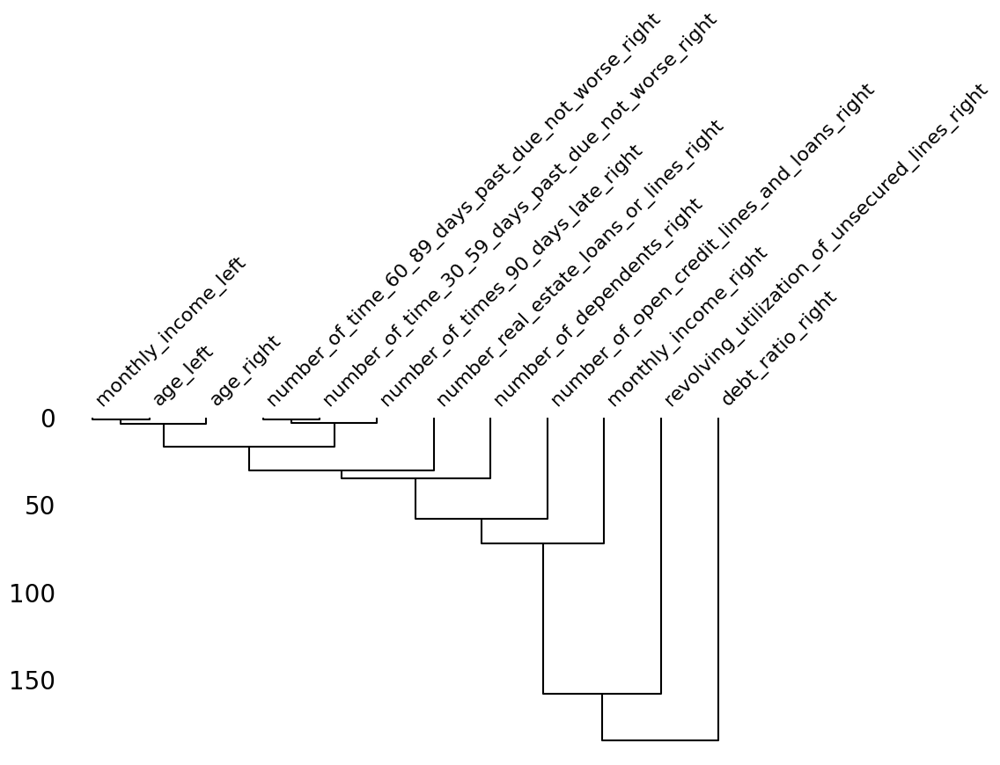

In [ ]:
msno.dendrogram(abnormal_df, figsize=(10, 5))

## Conclusion on Weird Insights (Part 1)
- the outlier value is actually having a pattern. we knew that the calculation of debt ratio is dependent on monthly income and also the revolving utilziation of unsecured lines and monthly income. 
- Conducting this analysis just to further proof that our assumption and theory is correct

<Axes: >

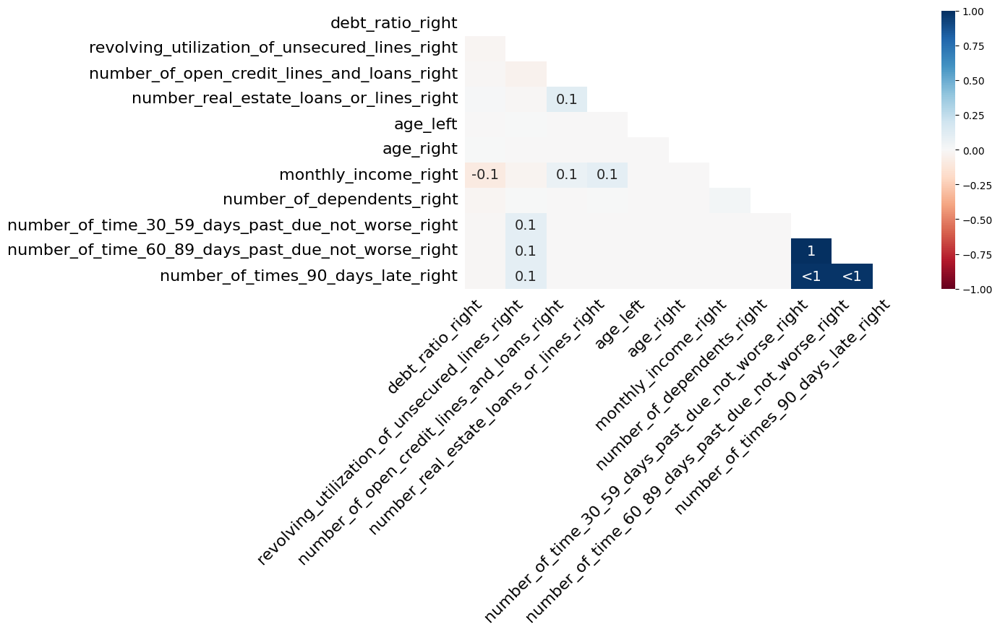

In [ ]:
msno.heatmap(abnormal_df, figsize=(10, 5))

## Conclusion on Weird Insights (Part 2)
- We can also see that once we conduct the outlier indicators, it is very obvious that all 3 the number of time 30_59, 60_89 and 90 days is actually correlate with each other which in another word, the calculation to generate that column having some issues where it suppose to only exists at only one of those columns

## Conclusion
1. Definitely the outliers have some hidden connections where during the pre-processing of this set of data, they are processed with the same technique.
2. For example, age can be possibly due to the dataset collected is year born, they used a baseline year to get this year age and it's not updated, or some issues with excel where they identify the two-digit number as different year range (1970 identified as 2070 when it's only given 70)
3. Monthly Income is probably a proxy / estimate
4. Debt ratio and utilization ratio are dependent on monthly income

# Check Missing Values

In [ ]:
col_list = ['debt_ratio', 'revolving_utilization_of_unsecured_lines', 'monthly_income']
mask = train_df.loc[:, 'monthly_income'].isna()
train_df.loc[mask, col_list]

,debt_ratio,revolving_utilization_of_unsecured_lines,monthly_income
7,5710.0,0.305682,NaN
9,46.0,0.116951,NaN
17,2058.0,0.061086,NaN
33,977.0,0.083418,NaN
42,75.0,0.072898,NaN
...,...,...,...
149977,60.0,0.000627,NaN
149978,349.0,0.236450,NaN
149985,25.0,0.037548,NaN
149993,4132.0,0.871976,NaN


In [ ]:
mask = train_df.loc[:, 'monthly_income'] == 0
train_df.loc[mask, :]

,serious_dlqin_2yrs,revolving_utilization_of_unsecured_lines,age,number_of_time_30_59_days_past_due_not_worse,debt_ratio,monthly_income,number_of_open_credit_lines_and_loans,number_of_times_90_days_late,number_real_estate_loans_or_lines,number_of_time_60_89_days_past_due_not_worse,number_of_dependents
15,0,0.019657,76,0,477.0,0.0,6,0,1,0,0.0
51,0,0.818978,73,0,3095.0,0.0,9,0,1,1,0.0
74,0,0.059669,31,0,3162.0,0.0,11,0,2,0,1.0
91,0,0.039388,51,0,15466.0,0.0,7,0,0,0,0.0
299,0,0.085152,25,0,1005.0,0.0,5,0,0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
149384,0,0.239302,63,0,3153.0,0.0,29,0,1,0,0.0
149563,0,0.230799,72,0,430.0,0.0,7,0,0,0,0.0
149647,0,0.080084,69,0,1248.0,0.0,8,0,1,0,1.0
149674,0,0.132362,82,0,4123.0,0.0,14,0,2,0,0.0


In [ ]:
train_df.describe(percentiles=[0.25, 0.5, 0.75, 0.99])

,serious_dlqin_2yrs,revolving_utilization_of_unsecured_lines,age,number_of_time_30_59_days_past_due_not_worse,debt_ratio,monthly_income,number_of_open_credit_lines_and_loans,number_of_times_90_days_late,number_real_estate_loans_or_lines,number_of_time_60_89_days_past_due_not_worse,number_of_dependents
count,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,1.202690e+05,150000.000000,150000.000000,150000.000000,150000.000000,146076.000000
mean,0.066840,6.048438,52.295207,0.421033,353.005076,6.670221e+03,8.452760,0.265973,1.018240,0.240387,0.757222
std,0.249746,249.755371,14.771866,4.192781,2037.818523,1.438467e+04,5.145951,4.169304,1.129771,4.155179,1.115086
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.029867,41.000000,0.000000,0.175074,3.400000e+03,5.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.154181,52.000000,0.000000,0.366508,5.400000e+03,8.000000,0.000000,1.000000,0.000000,0.000000
75%,0.000000,0.559046,63.000000,0.000000,0.868254,8.249000e+03,11.000000,0.000000,2.000000,0.000000,1.000000
99%,1.000000,1.092956,87.000000,4.000000,4979.040000,2.500000e+04,24.000000,3.000000,4.000000,2.000000,4.000000
max,1.000000,50708.000000,109.000000,98.000000,329664.000000,3.008750e+06,58.000000,98.000000,54.000000,98.000000,20.000000


## Conclustion
- Suspecting that the missing monthly income or the 0 income might been fill into debt_ratio columns, and some of the debt ratio columns might be in percentage instead of just range 0-1, or it can also be the value is filled in directly because no monthly income data.

- Suggestion: will definitely ask to reprocess the data.

- For now since we couldn't do anything it might be best to impute some of the values with median.

- It might be a good idea to cap certain data.

# Check Density Plot
- We only look at the data with a relatively normal range.

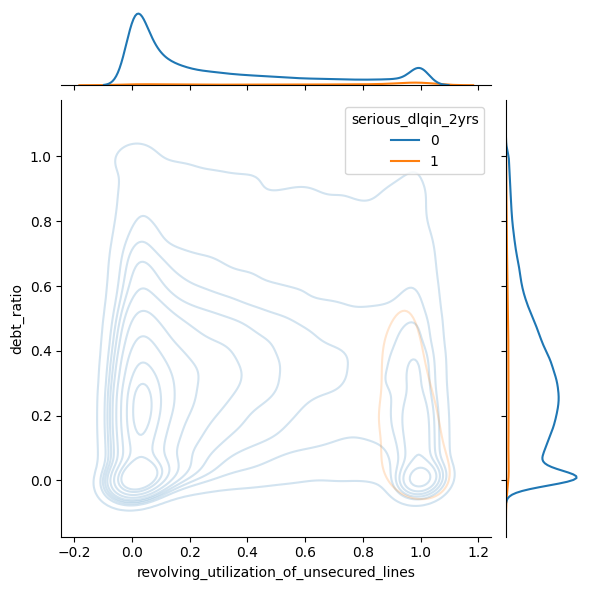

In [ ]:
x = 'revolving_utilization_of_unsecured_lines'
y = 'debt_ratio'
mask1 = train_df.loc[:, x] <= 1
mask2 = train_df.loc[:, y] <= 1
mask = mask1 & mask2

sns.jointplot(
    data=train_df.loc[mask, :],
    x=x,
    y=y,
    hue=target,
    kind='kde',
    alpha=0.2
)
plt.show()

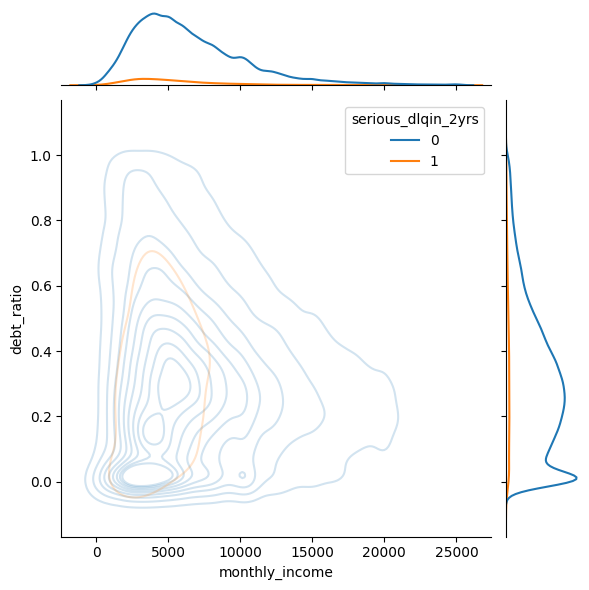

In [ ]:
x = 'monthly_income'
y = 'debt_ratio'
mask1 = train_df.loc[:, x] <= train_df.loc[:, x].quantile(0.99)
mask2 = train_df.loc[:, y] <= 1
mask = mask1 & mask2
sns.jointplot(
    data=train_df.loc[mask, :],
    x=x,
    y=y,
    hue=target,
    kind='kde',
    alpha=0.2
)
plt.show()

# Conclusion
As expected, there's a peak with higher revolving utilization rate and debt ratio

# Clean Up Missing Values

## Monthly Income

In [ ]:
train_df1 = train_df.copy(deep=True)

In [ ]:
col = 'monthly_income'
mask1 = train_df1.loc[:, col] == 0
mask2 = train_df1.loc[:, col].isna()
mask = mask1 | mask2
col_list = ['revolving_utilization_of_unsecured_lines', 'debt_ratio']

display(
    train_df1.loc[mask, :].sort_values(by=col_list[0]),
    train_df1.loc[mask, :].sort_values(by=col_list[1]),
    train_df1.loc[mask, :].describe()
    )

,serious_dlqin_2yrs,revolving_utilization_of_unsecured_lines,age,number_of_time_30_59_days_past_due_not_worse,debt_ratio,monthly_income,number_of_open_credit_lines_and_loans,number_of_times_90_days_late,number_real_estate_loans_or_lines,number_of_time_60_89_days_past_due_not_worse,number_of_dependents
14209,0,0.0,21,0,1050.0,NaN,5,0,1,0,NaN
141715,0,0.0,72,0,98.0,NaN,11,0,1,0,0.0
16046,0,0.0,74,0,1866.0,NaN,5,0,2,0,0.0
34308,0,0.0,51,0,0.0,NaN,4,0,0,0,0.0
109529,0,0.0,53,0,568.0,NaN,7,0,0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
144888,1,8328.0,39,0,21395.0,NaN,9,0,2,1,0.0
76727,0,10821.0,51,0,2028.0,NaN,7,0,1,0,NaN
83053,0,11553.0,66,1,3742.0,NaN,6,0,1,0,2.0
124534,0,13930.0,45,0,4902.0,NaN,4,0,2,0,0.0


,serious_dlqin_2yrs,revolving_utilization_of_unsecured_lines,age,number_of_time_30_59_days_past_due_not_worse,debt_ratio,monthly_income,number_of_open_credit_lines_and_loans,number_of_times_90_days_late,number_real_estate_loans_or_lines,number_of_time_60_89_days_past_due_not_worse,number_of_dependents
110897,0,1.000000,84,0,0.0,0.0,0,0,0,0,0.0
126300,0,0.000000,87,0,0.0,NaN,2,0,0,0,NaN
24981,0,1.000000,65,0,0.0,NaN,0,0,0,0,NaN
110290,1,1.000000,56,0,0.0,NaN,0,1,0,0,0.0
101200,0,0.000000,61,0,0.0,NaN,4,0,0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
4855,0,0.000000,56,0,168835.0,NaN,10,0,3,0,2.0
58901,0,0.182640,37,0,220516.0,NaN,8,0,3,0,NaN
127048,0,0.034290,58,1,307001.0,NaN,16,0,4,0,2.0
36601,0,0.001782,65,0,326442.0,NaN,6,0,1,0,0.0


,serious_dlqin_2yrs,revolving_utilization_of_unsecured_lines,age,number_of_time_30_59_days_past_due_not_worse,debt_ratio,monthly_income,number_of_open_credit_lines_and_loans,number_of_times_90_days_late,number_real_estate_loans_or_lines,number_of_time_60_89_days_past_due_not_worse,number_of_dependents
count,31365.000000,31365.000000,31365.000000,31365.000000,31365.000000,1634.0,31365.000000,31365.000000,31365.000000,31365.000000,27441.000000
mean,0.055316,6.526814,55.944269,0.580743,1668.195823,0.0,7.208034,0.484680,0.863415,0.453563,0.340986
std,0.228601,214.688501,15.608183,6.263770,4185.968629,0.0,4.843125,6.258997,1.028463,6.250769,0.842831
min,0.000000,0.000000,21.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.016279,45.000000,0.000000,122.000000,0.0,4.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.082731,57.000000,0.000000,1144.000000,0.0,6.000000,0.000000,1.000000,0.000000,0.000000
75%,0.000000,0.442353,67.000000,0.000000,2373.000000,0.0,10.000000,0.000000,1.000000,0.000000,0.000000
max,1.000000,22198.000000,109.000000,98.000000,329664.000000,0.0,45.000000,98.000000,23.000000,98.000000,10.000000


In [ ]:
col_list = ['revolving_utilization_of_unsecured_lines', 'debt_ratio']
# train_df1.loc[mask, 'debt_ratio'] = 0
# train_df1.loc[mask, 'revolving_utilization_of_unsecured_lines'] = 0
train_df1.loc[mask, 'monthly_income'] = train_df1.loc[mask, col_list].sum(axis=1)
train_df1.loc[:, 'monthly_income_imputed'] = np.where(mask, 1, 0)

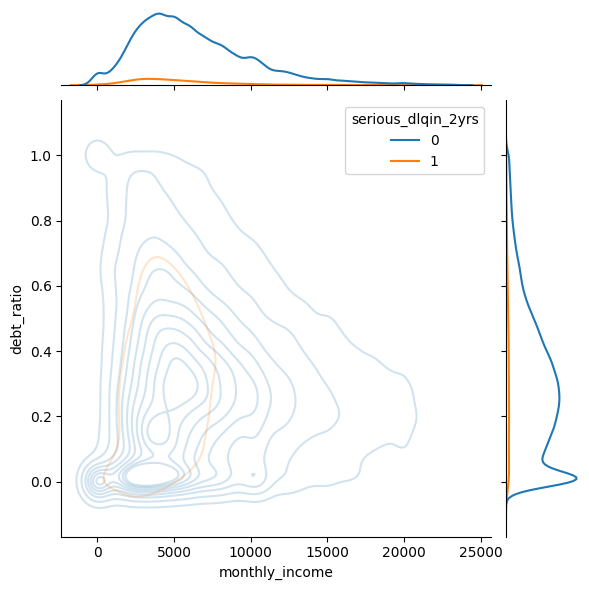

In [ ]:
x = 'monthly_income'
y = 'debt_ratio'
mask1 = train_df1.loc[:, x] <= train_df1.loc[:, x].quantile(0.99)
mask2 = train_df1.loc[:, y] <= 1
mask = mask1 & mask2
sns.jointplot(
    data=train_df1.loc[mask, :],
    x=x,
    y=y,
    hue=target,
    kind='kde',
    alpha=0.2
)
plt.show()

After imputing, doesnt seems to impact much on the original distribution.

## Number of Dependents

In [ ]:
train_df1.loc[:, 'number_of_dependents'] = train_df1.loc[:, 'number_of_dependents'].fillna(0)

# Output

In [ ]:
if OUTPUT:
  train_df.to_csv(f'{OUTPUT_DIR}train_df.csv', index=False)
  valid_df.to_csv(f'{OUTPUT_DIR}valid_df.csv', index=False)
  train_df1.to_csv(f'{OUTPUT_DIR}train_df1.csv', index=False)

# Key Information Needed
- What are the current loss with the current delinquency define? 
- Is there any comparison done using other days instead of 90 days?
- What kind of loan product is offered in this dataset?
- What is the current screening policy (minimum compliance age, minimum income required, etc)
- Loan Amount, Interest Rate, Tenure
- Is there any credit policy changed?
- The clarification of columns whether which data is coming in before application of the loan

All these question revolve in an external changes of environment which will decide our sample is relatable or not. 

- There are chances that the people can just marginally past the 90 days like 89 days or 91 days. This could further iuncrease the noise for model to find out those who is very close to each other. Will need to take a look on cumulative plot to check on how the tails looks like. 



# Next Steps
- Conduct Optimal Binning
    - Check if it's relatively important to handle the missing values.
    - Check on the features importance based on the scores - as a reference if converted to categorical variables and logistic regression model.